In [1]:
import pymn
import pandas as pd
import matplotlib.pyplot as plt
import scanpy as sc
import anndata as ad
import numpy as np
import itertools
import scipy.stats
import seaborn as sns
#import scbean
# import scbean.model.vipcca as vip
# import scbean.tools.utils as tl
# import scbean.tools.plotting as pl
sc.settings.verbosity = 3   

In [2]:
norm_data = sc.read_h5ad('/data/passala/Collaborator_Data/Bruno_Ken_Collab/Post_review_Dataset/unintegrated_data_fast.h5ad')


In [3]:
norm_data

AnnData object with n_obs × n_vars = 47536 × 60708

In [4]:
norm_data.var['ZM'] = norm_data.var_names.str.startswith('Zm')
norm_data = norm_data[:, norm_data.var['ZM'] == True] 
norm_data.var#

,ZM
Zm00001d027230,True
Zm00001d027231,True
Zm00001d027236,True
Zm00001d027239,True
Zm00001d027240,True
...,...
Zm00001d033266,True
Zm00001d032469,True
Zm00001d029568,True
Zm00001d047419,True


In [5]:
norm_data.obs

""
Maize_Cell1_AAACCTGAGAGCTTCT
Maize_Cell1_AAACCTGAGTGATCGG
Maize_Cell1_AAACCTGCACTGTCGG
Maize_Cell1_AAACCTGGTGTGAAAT
Maize_Cell1_AAACCTGTCTCAAGTG
...
Set_Cells_3_TTTGGTTTCTGGGTCG
Set_Cells_3_TTTGTTGAGGCTCACC
Set_Cells_3_TTTGTTGCAACCAGAG
Set_Cells_3_TTTGTTGCAGTCTACA


In [6]:
cell_identity = pd.read_csv('/data/passala/Collaborator_Data/Bruno_Ken_Collab/Post_review_Dataset/Meta_Maize_Sorghum_Setaria_Nuclei_Cells_SCT_OrthologousgenesGoodname_Sept2022.csv',index_col = 0)
cell_identity

,orig.ident,nCount_RNA,nFeature_RNA,nCount_SCT,nFeature_SCT,integrated_snn_res.0.6,seurat_clusters,Species,Annotation,type
Maize_Cell1_AAACCTGAGAGCTTCT,Maize_Cell_1,7907,3206,13445,3280,6,6,Maize,Cortex_4,Cell
Maize_Cell1_AAACCTGAGTGATCGG,Maize_Cell_1,11556,3579,14008,3580,7,7,Maize,Stele_2,Cell
Maize_Cell1_AAACCTGCACTGTCGG,Maize_Cell_1,19725,4690,15803,4688,1,1,Maize,Cortex_1,Cell
Maize_Cell1_AAACCTGGTGTGAAAT,Maize_Cell_1,17272,4355,15469,4354,6,6,Maize,Cortex_4,Cell
Maize_Cell1_AAACCTGTCTCAAGTG,Maize_Cell_1,11246,3548,13956,3546,14,14,Maize,Epidermis_2,Cell
...,...,...,...,...,...,...,...,...,...,...
Set_Cells_3_TTTGGTTTCTGGGTCG,Set_Cells_3,9192,2954,21040,3212,14,14,Setaria,Epidermis_2,Cell
Set_Cells_3_TTTGTTGAGGCTCACC,Set_Cells_3,27048,4655,23549,4654,16,16,Setaria,Trichoblast,Cell
Set_Cells_3_TTTGTTGCAACCAGAG,Set_Cells_3,21855,5009,22238,5009,17,17,Setaria,Phloem,Cell
Set_Cells_3_TTTGTTGCAGTCTACA,Set_Cells_3,9015,2669,20346,3006,3,3,Setaria,LRC,Cell


In [7]:
norm_data.obs['Cell Cluster Annotation'] = cell_identity['Annotation']
norm_data.obs['Batch'] = cell_identity['orig.ident']
norm_data.obs['Species'] = cell_identity['Species']


/tmp/ipykernel_3996510/3560309651.py:1: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  norm_data.obs['Cell Cluster Annotation'] = cell_identity['Annotation']


In [8]:
norm_data.obs['Cluster and Type'] = norm_data.obs['Cell Cluster Annotation']
norm_data.obs['Cluster and Type'].loc[norm_data.obs_names.str.contains('Nucl')] = norm_data.obs['Cluster and Type'] + ' Nucl'
norm_data.obs['Cluster and Type'].loc[norm_data.obs_names.str.contains('Cell')] = norm_data.obs['Cluster and Type'] + ' Cell'
norm_data.obs['Cluster and Species'] = norm_data.obs['Cell Cluster Annotation']
norm_data.obs['Cluster and Species'].loc[norm_data.obs['Species'].str.contains('Maize')] = norm_data.obs['Cluster and Type'] + ' Maize'
norm_data.obs['Cluster and Species'].loc[norm_data.obs['Species'].str.contains('Millet')] = norm_data.obs['Cluster and Type'] + ' Millet'
norm_data.obs['Cluster and Species'].loc[norm_data.obs['Species'].str.contains('Sorghum')] = norm_data.obs['Cluster and Type'] + ' Sorghum'
norm_data.obs['Type'] = np.nan
norm_data.obs['Type'].loc[norm_data.obs_names.str.contains('Nucl')] = 'Nucl'
norm_data.obs['Type'].loc[norm_data.obs_names.str.contains('Cell')] = 'Cell'
norm_data.obs['Type and Species'] = norm_data.obs['Species'] + ' '+  norm_data.obs['Type']
norm_data.obs

/tmp/ipykernel_3996510/825010106.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  norm_data.obs['Type'].loc[norm_data.obs_names.str.contains('Nucl')] = 'Nucl'


,Cell Cluster Annotation,Batch,Species,Cluster and Type,Cluster and Species,Type,Type and Species
Maize_Cell1_AAACCTGAGAGCTTCT,Cortex_4,Maize_Cell_1,Maize,Cortex_4 Cell,Cortex_4 Cell Maize,Cell,Maize Cell
Maize_Cell1_AAACCTGAGTGATCGG,Stele_2,Maize_Cell_1,Maize,Stele_2 Cell,Stele_2 Cell Maize,Cell,Maize Cell
Maize_Cell1_AAACCTGCACTGTCGG,Cortex_1,Maize_Cell_1,Maize,Cortex_1 Cell,Cortex_1 Cell Maize,Cell,Maize Cell
Maize_Cell1_AAACCTGGTGTGAAAT,Cortex_4,Maize_Cell_1,Maize,Cortex_4 Cell,Cortex_4 Cell Maize,Cell,Maize Cell
Maize_Cell1_AAACCTGTCTCAAGTG,Epidermis_2,Maize_Cell_1,Maize,Epidermis_2 Cell,Epidermis_2 Cell Maize,Cell,Maize Cell
...,...,...,...,...,...,...,...
Set_Cells_3_TTTGGTTTCTGGGTCG,Epidermis_2,Set_Cells_3,Setaria,Epidermis_2 Cell,Epidermis_2,Cell,Setaria Cell
Set_Cells_3_TTTGTTGAGGCTCACC,Trichoblast,Set_Cells_3,Setaria,Trichoblast Cell,Trichoblast,Cell,Setaria Cell
Set_Cells_3_TTTGTTGCAACCAGAG,Phloem,Set_Cells_3,Setaria,Phloem Cell,Phloem,Cell,Setaria Cell
Set_Cells_3_TTTGTTGCAGTCTACA,LRC,Set_Cells_3,Setaria,LRC Cell,LRC,Cell,Setaria Cell


In [9]:
sc.pp.filter_genes(norm_data, min_cells=10)
sc.pp.filter_cells(norm_data, min_genes=850)

filtered out 2586 genes that are detected in less than 10 cells
filtered out 23460 cells that have less than 850 genes expressed


In [10]:
sc.pp.calculate_qc_metrics(norm_data, percent_top=None, log1p=False, inplace=True)


In [11]:
batch_list = list(norm_data.obs['Batch'].unique())

In [12]:
sc.pp.log1p(norm_data)

In [13]:
sc.pp.highly_variable_genes(norm_data, min_mean=0.0125, max_mean=3, min_disp=0.5, batch_key = 'Batch')

extracting highly variable genes


/home/passala/miniconda3/envs/Single_cell_data_fix/lib/python3.9/site-packages/scanpy/preprocessing/_highly_variable_genes.py:478: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hvg = hvg.append(missing_hvg, ignore_index=True)
/home/passala/miniconda3/envs/Single_cell_data_fix/lib/python3.9/site-packages/scanpy/preprocessing/_highly_variable_genes.py:478: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hvg = hvg.append(missing_hvg, ignore_index=True)
/home/passala/miniconda3/envs/Single_cell_data_fix/lib/python3.9/site-packages/scanpy/preprocessing/_highly_variable_genes.py:478: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hvg = hvg.append(missing_hvg, ignore_index=True)
/home/passala/miniconda3/envs/Single_cell_data_fix/lib/

    finished (0:00:25)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


In [14]:
# sc.pp.regress_out(norm_data, ['total_counts'])


In [15]:
sc.pp.scale(norm_data, max_value=10)


In [16]:
highly_variable_genes_across_batches  = norm_data.var['highly_variable_nbatches']>2
norm_data.var['highly_variable'].loc[highly_variable_genes_across_batches] = True


/tmp/ipykernel_3996510/2314331044.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  norm_data.var['highly_variable'].loc[highly_variable_genes_across_batches] = True


In [17]:
high_var_list = norm_data.var.loc[highly_variable_genes_across_batches].index.to_list()


In [18]:
norm_data.var['highly_variable_nbatches'].value_counts()

0     10941
1      6341
2      3853
3      2306
4      1233
5       727
6       502
7       353
8       204
9       142
10      125
11       75
12       59
13       33
14       31
15       22
16        6
Name: highly_variable_nbatches, dtype: int64

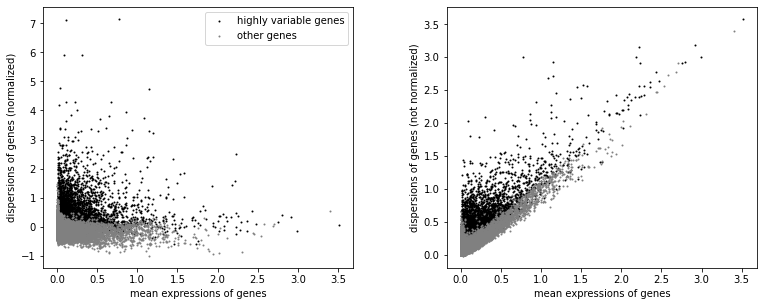

In [19]:
sc.pl.highly_variable_genes(norm_data)

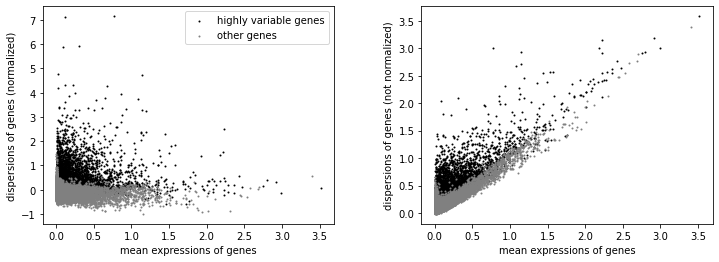

In [20]:
sc.pl.highly_variable_genes(norm_data, show = True)

In [21]:
sc.tl.pca(norm_data, svd_solver='arpack')
sc.pp.neighbors(norm_data, n_neighbors=10, n_pcs=40)
sc.tl.umap(norm_data)


computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:17)
computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:01:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:01:16)


In [22]:
# sc.tl.leiden(norm_data)


In [23]:
sc.set_figure_params(figsize = (15,15))


In [24]:
#sc.pl.umap(norm_data, color=['Cell Cluster Annotation'], s = 8)

In [25]:
#sc.pl.umap(norm_data, color=['Batch'], s = 4)

In [26]:
norm_data.obs['Type and Species'].value_counts()

Setaria Cell    8933
Maize Cell      4324
Maize Nucl      3291
Sorghum Cell    3277
Sorghum Nucl    2195
Setaria Nucl    2056
Name: Type and Species, dtype: int64

In [27]:
import scanorama
#sc.tl.pca(concatenated_alpha_beta_database, svd_solver='arpack', )

sc.external.pp.scanorama_integrate(norm_data,'Batch')
sc.pp.neighbors(norm_data, n_neighbors = 10, n_pcs = 40, use_rep= 'X_scanorama', random_state = 34)
sc.tl.umap(norm_data, random_state= 76)


[[0.00000000e+00 6.28169014e-01 5.68604651e-01 1.76991150e-01
  7.19351570e-02 0.00000000e+00 7.98722045e-04 0.00000000e+00
  0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
  0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 7.69953052e-01 1.76991150e-02
  1.03286385e-02 0.00000000e+00 0.00000000e+00 0.00000000e+00
  0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
  0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 1.32743363e-01
  4.30232558e-02 0.00000000e+00 1.16279070e-03 1.27906977e-02
  0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
  0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
  8.76106195e-01 7.61061947e-01 7.78761062e-01 0.00000000e+00
  0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
  0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00]
 [0.

/home/passala/miniconda3/envs/Single_cell_data_fix/lib/python3.9/site-packages/sklearn/manifold/_spectral_embedding.py:259: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:01:35)


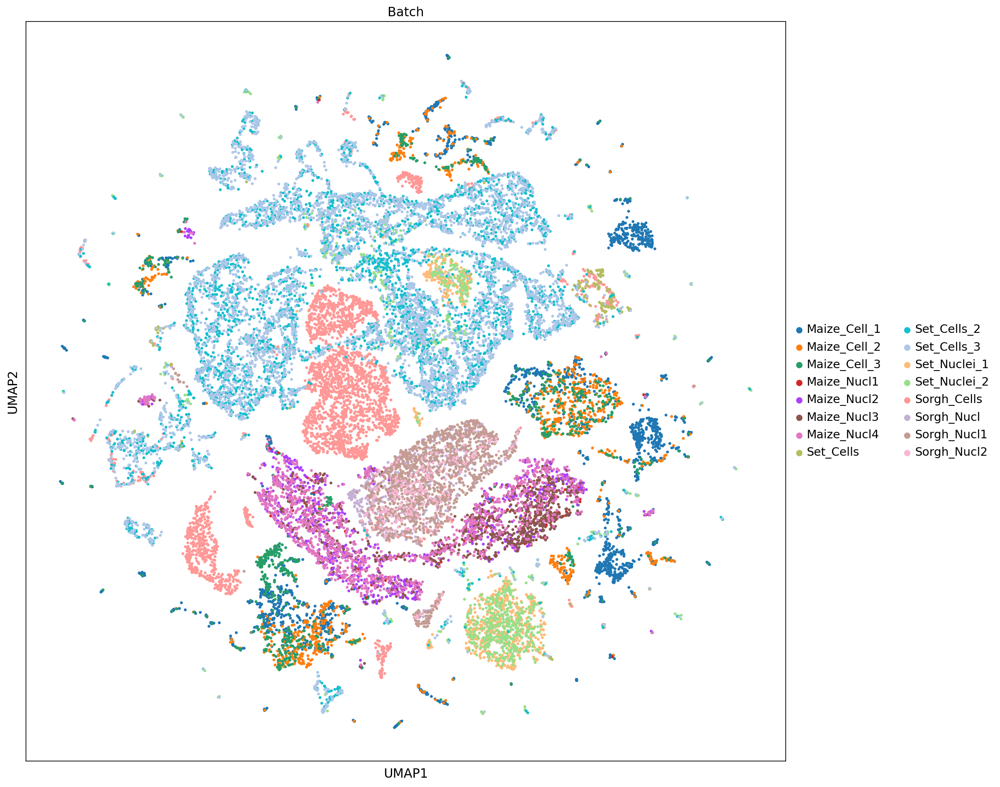

In [28]:
sc.pl.umap(norm_data, color= ['Batch'], s = 40,)

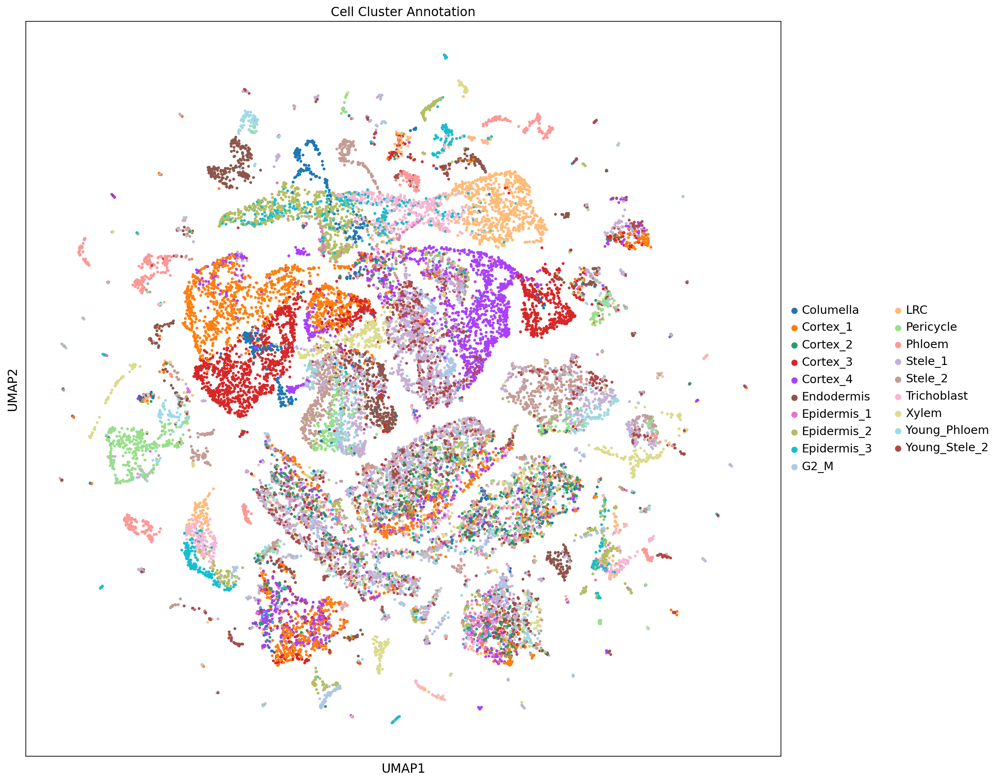

In [29]:
sc.pl.umap(norm_data, color= ['Cell Cluster Annotation'], s = 40,)

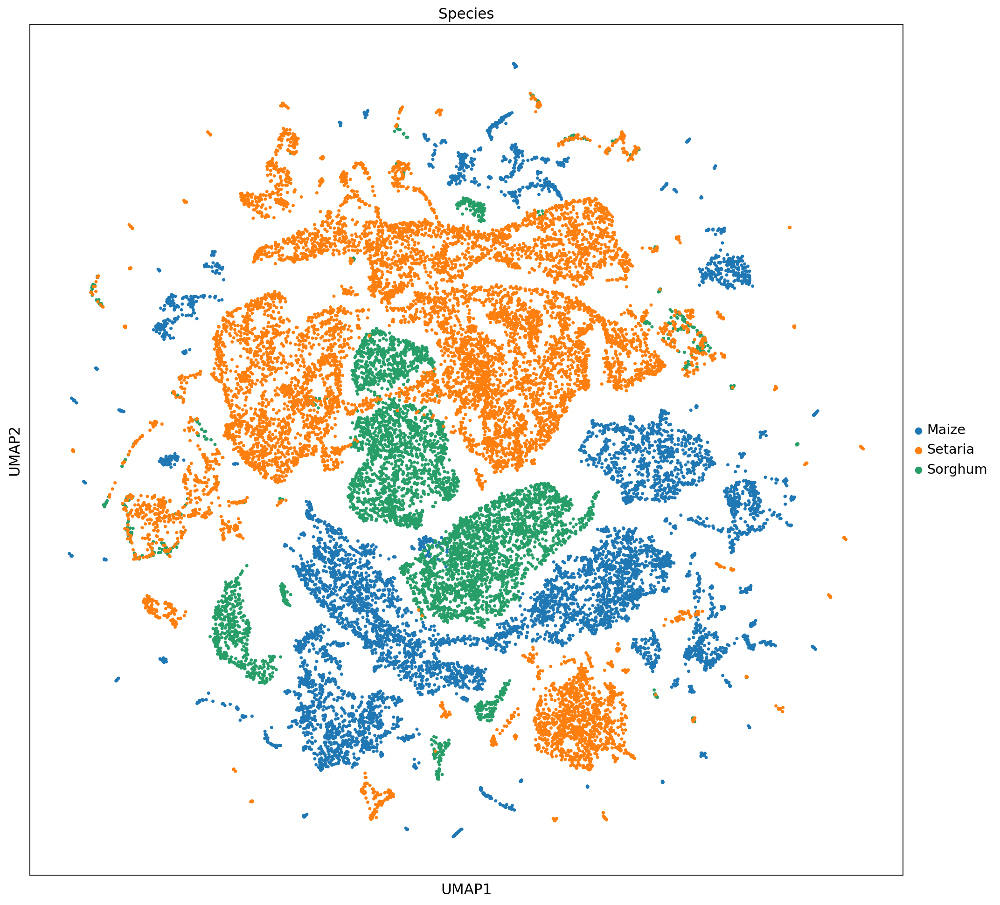

In [30]:
sc.pl.umap(norm_data, color= ['Species'], s = 40,)

In [ ]:
import os 
os.environ["TF_CPP_MIN_LOG_LEVEL"] = "2"
handle = vip.VIPCCA(
    adata_all=norm_data,
    res_path='/data/passala/Generated_Tables/Temp_junk/Junk_models',
    mode='CVAE',
    split_by="Species",
    epochs=1200,
    lambda_regulizer=5,
    batch_input_size=128,
    batch_input_size2=16,
    patience_es = 400,
    patience_lr= 100
)

In [ ]:
# adata_integrate = handle.fit_integrate()


In [ ]:
adata_integrate

In [ ]:
adata_integrate.write('/data/passala/Generated_Tables/Temp_junk/integrated_all_of_brunos_for_plotting_by_species.h5ad')

In [ ]:
### Here restart kernel, and comment out scbean stuff

In [ ]:
adata_integrate = sc.read_h5ad('/data/passala/Generated_Tables/Temp_junk/integrated_all_of_brunos_for_plotting.h5ad')

In [ ]:
adata_integrate

AnnData object with n_obs × n_vars = 47536 × 29539
    obs: 'Cell Cluster Annotation', 'Batch', 'Species', 'Cluster and Type', 'Cluster and Species', 'Type', 'Type and Species', 'n_genes_by_counts', 'total_counts'
    var: 'ZM', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection', 'mean', 'std'
    obsm: 'X_vipcca'

In [ ]:
sc.pp.neighbors(adata_integrate, use_rep='X_vipcca')
sc.tl.umap(adata_integrate)

computing neighbors


2022-10-15 09:56:36.166522: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F AVX512_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-10-15 09:56:36.287155: I tensorflow/core/util/util.cc:169] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2022-10-15 09:56:36.291342: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-10-15 09:56:36.291355: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if yo

    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:16)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:33)


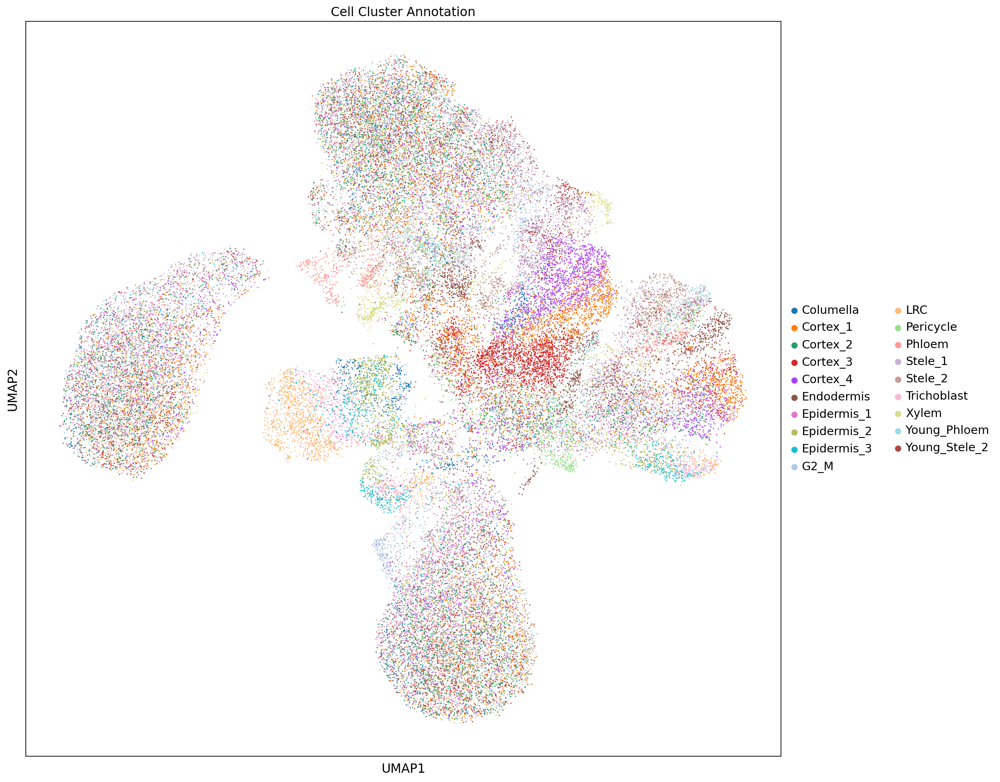

In [ ]:
sc.pl.umap(adata_integrate, color=['Cell Cluster Annotation'], s = 8)


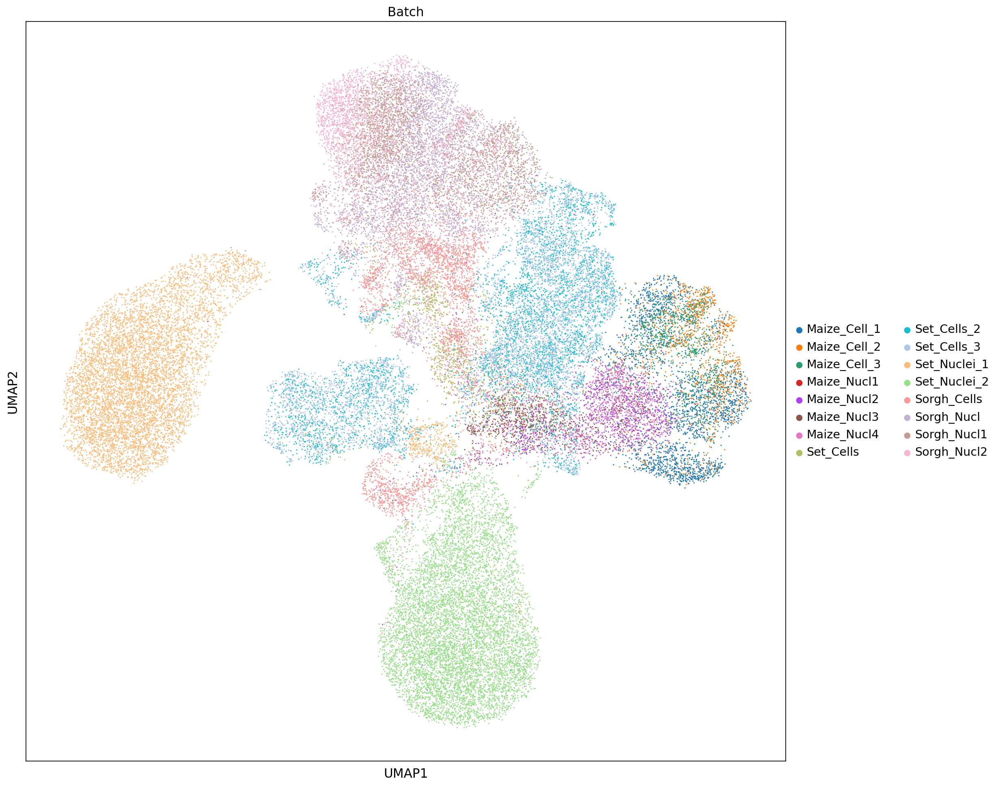

In [ ]:
sc.pl.umap(adata_integrate, color=['Batch'], s = 8)

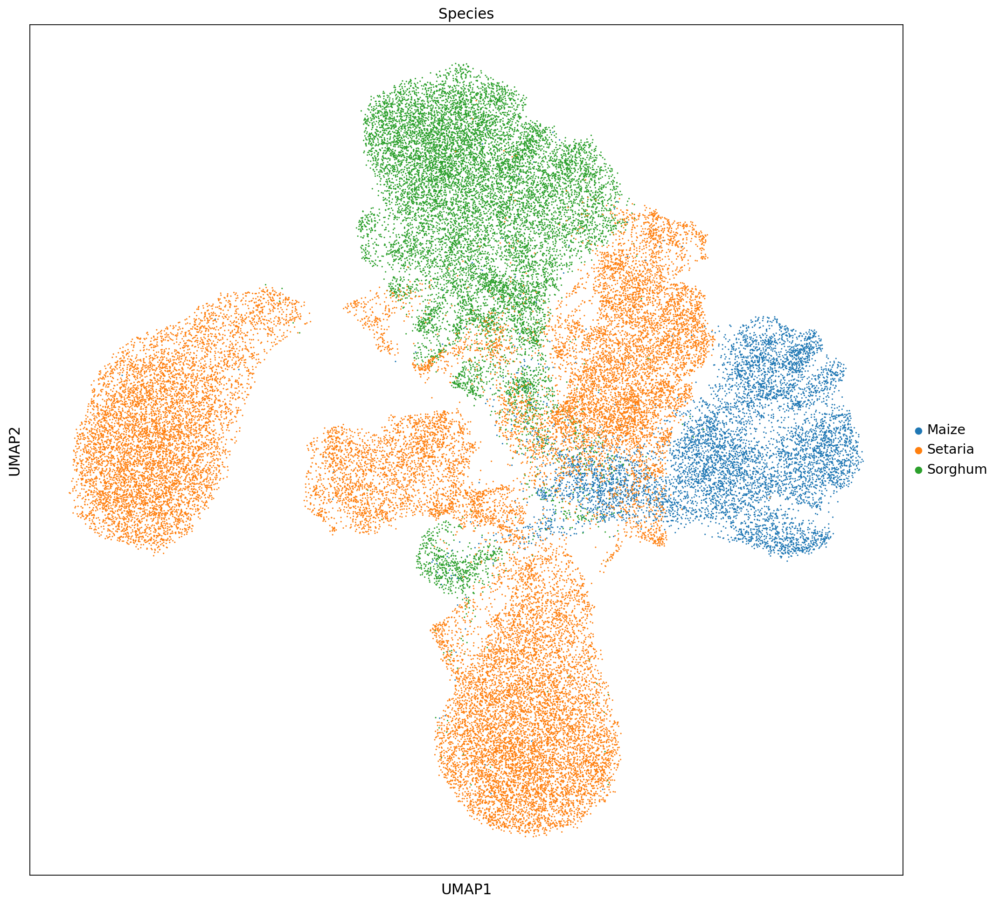

In [ ]:
sc.pl.umap(adata_integrate, color=['Species'], s = 8)

In [ ]:
batches = norm_data.obs['Type and Species'].cat.categories.tolist()
alldata = {}
for batch in batches:
    alldata[batch] = norm_data[norm_data.obs['Type and Species'] == batch,]

alldata

In [ ]:
just_maize_cell = alldata['Maize Cell']
just_maize_nucl = alldata['Maize Nucl']

just_sorg_cell = alldata['Sorghum Cell']
just_sorg_nucl = alldata['Sorghum Nucl']

just_millet_cell = alldata['Setaria Cell']
just_millet_nucl = alldata['Setaria Nucl']



In [ ]:
just_millet_cell.obs['Cell Type'] = just_millet_cell.obs['Cell Cluster Annotation']
sc.tl.pca(just_millet_cell, svd_solver='arpack')
sc.pp.neighbors(just_millet_cell, n_neighbors=10, n_pcs=40)
sc.tl.umap(just_millet_cell)

In [ ]:
sc.pl.umap(just_millet_cell, color='Batch', s = 40)


In [ ]:
sc.pl.umap(just_millet_cell, color='Cell Cluster Annotation', s = 40)


In [ ]:
sc.pl.umap(just_maize_cell, color=['Cell Type'], wspace=0.5)


In [ ]:
sc.pl.umap(just_maize_cell, color=['Batch'], wspace=0.5)


In [ ]:
adata_concat = just_millet_cell.concatenate(just_maize_cell, batch_categories=['ref', 'new'])


In [ ]:
sc.pl.umap(adata_concat, color=['Batch'], wspace=0.5)


In [ ]:
adatas = list(alldata.values())

In [ ]:
adatas

In [ ]:
alldata.keys()

In [ ]:
norm_data

In [ ]:
highly_variable_genes_across_batches

In [ ]:
sc.tl.pca(norm_data, svd_solver='arpack')
sc.pp.neighbors(norm_data, n_neighbors=10, n_pcs=40)
sc.tl.umap(norm_data)


In [ ]:
sc.pl.umap(norm_data, color=['Species', 'Cell Cluster Annotation', 'Type and Species'])

In [ ]:
sc.pl.umap(norm_data, color=['Cell Cluster Annotation'], s = 8)

In [ ]:
alldata2 = dict()
for ds in alldata.keys():
    print(ds)
    alldata2[ds] = alldata[ds][:,highly_variable_genes_across_batches]


In [ ]:
#convert to list of AnnData objects
adatas = list(alldata2.values())

In [ ]:
scanorama.integrate_scanpy(adatas, dimred = 50)

In [ ]:
scanorama_int = [ad.obsm['X_scanorama'] for ad in adatas]
all_s = np.concatenate(scanorama_int)
print(all_s.shape)
norm_data.obsm["Scanorama"] = all_s

In [ ]:
sc.pp.neighbors(norm_data, n_pcs =50, use_rep = "Scanorama")
sc.tl.umap(norm_data)

In [ ]:
sc.set_figure_params(figsize = (10,10))


In [ ]:
sc.pl.umap(norm_data, color=['Species'], s = 1)

In [ ]:
sc.pl.umap(norm_data, color=['Cell Cluster Annotation'], s = 4)

In [ ]:
sc.pl.umap(norm_data, color=['Type and Species'])